The lightning strike data, lidar data, and arial imagery were downloaded from
#### New Zealand land info ----> https://www.linz.govt.nz/

In [3]:
# %load template.py
import glob
import io
import ipyleaflet
import IPython.display
import ipyvolume.pylab as p3
import json
import matplotlib.cm
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pdal
import PIL
import pyproj
import requests
import fiona
import shapely.geometry
from shapely.geometry import mapping
import subprocess
import scipy.spatial
import sys
import urllib.request

%load_ext autoreload
%autoreload 2
    
sys.path.append('../src')
from pcl_utils import local_max

# Url for aerial imagery
# IVaerial = "https://geoservices.informatievlaanderen.be/raadpleegdiensten/ogw/wms?SERVICE=WMS&VERSION=1.3.0&REQUEST=GetMap&CRS=EPSG:31370&BBOX={0},{1},{2},{3}&WIDTH=512&HEIGHT=512&LAYERS=OGWRGB13_15VL&STYLES=default&FORMAT=image/png"

%matplotlib inline

In [4]:
if not os.path.isdir("../data"):
    os.makedirs("../data")
lidar_filepath = "/media/thistle/Passport/gis/nz/lidar/points1.las"
lidar_filename = lidar_filepath.split("/")[-1]
if not os.path.isfile("../data/{}".format(lidar_filename)):
    subprocess.run(["cp", lidar_filepath, "../data/" + lidar_filename])

In [197]:
file_in = lidar_filepath
file_out1 = "../data/nz_clipped_las.las"  # clipped .las file
file_out2 = "../data/nz_clipped_tif.tif"  # final clipped DEM


In [160]:
# !pdal info $file_in

In [198]:
# try to find the tile from lidar index that contains another shape
#for a strikingly interesting get the polygon shape from qgis and save as "../data/aoi/nz_aois.shp"
# this is a small polygon with 5 million or less points
filepath = "/home/thistle/Documents/dev/ML/gis_project/data/data_folders/MtMagneto_ss.shp"
# this contains one shape- Mt Magneto
# see qgis projects @ /media/thistle/Passport/gis/nz/del_dems.qgz and /media/thistle/Passport/gis/nz/gold_nz.qgz

c = fiona.open(filepath)
rec1 = c.next()

rec1 # srs already set to epsg:2193
# this polygon was drawn at a site where lightning strikes seem more than random :]
# Mt Magneto near the arrow river site

mtmag_poly = rec1.get('geometry').get('coordinates')[0]

p1 = shapely.geometry.Polygon(mtmag_poly)
mtmag_poly

/home/thistle/anaconda3/envs/nb-pcp-env/lib/python3.7/site-packages/ipykernel_launcher.py:9: FionaDeprecationWarning: Collection.__next__() is buggy and will be removed in Fiona 2.0. Switch to `next(iter(collection))`.
  if __name__ == '__main__':


[(1275016.4912221471, 5004844.812846744),
 (1275101.419895499, 5005605.632212188),
 (1275412.8250311224, 5005570.245264959),
 (1275423.4411152916, 5005004.054109279),
 (1275533.1406517043, 5003921.213524043),
 (1275126.1907585599, 5004002.603502671),
 (1275016.4912221471, 5004844.812846744)]

In [166]:
fp = "/home/thistle/Documents/dev/ML/gis_project/data/data_folders/lidar_index_tile.shp"
c = fiona.open(fp)
rec1 = c.next()
coords = rec1['geometry']['coordinates'][0]

/home/thistle/anaconda3/envs/nb-pcp-env/lib/python3.7/site-packages/ipykernel_launcher.py:3: FionaDeprecationWarning: Collection.__next__() is buggy and will be removed in Fiona 2.0. Switch to `next(iter(collection))`.
  This is separate from the ipykernel package so we can avoid doing imports until


In [167]:
p2 = shapely.geometry.Polygon(coords)

In [179]:
p1.area/p2.area

0.07314638228566607

In [182]:
!pdal info ../data/goob.las

{
  "filename": "../data/goob.las",
  "pdal_version": "2.0.1 (git-version: 6600e6)",
  "stats":
  {
    "bbox":
    {
      "EPSG:4326":
      {
        "bbox":
        {
          "maxx": 168.8748956,
          "maxy": -45.03186094,
          "maxz": 1424.1,
          "minx": 168.873906,
          "miny": -45.03820787,
          "minz": 1286.79
        },
        "boundary": "{ \"type\": \"Polygon\", \"coordinates\": [ [ [ 168.873906026014822, -45.038188544668728, 1286.79 ], [ 168.874361494847477, -45.031860944473223, 1286.79 ], [ 168.874895577362452, -45.031880270078183, 1424.1 ], [ 168.874440167084146, -45.038207874514029, 1424.1 ], [ 168.873906026014822, -45.038188544668728, 1286.79 ] ] ] }"
      },
      "native":
      {
        "bbox":
        {
          "maxx": 1275059.08,
          "maxy": 5005225.04,
          "maxz": 1424.1,
          "minx": 1275016.9,
          "miny": 5004520.29,
          "minz": 1286.79
        },
        "boundary": "{ \"type\": \"Polygon\", \"coordi

In [181]:
!pdal info $lidar_filepath

{
  "filename": "/media/thistle/Passport/gis/nz/lidar/points2.las",
  "pdal_version": "2.0.1 (git-version: 6600e6)",
  "stats":
  {
    "bbox":
    {
      "EPSG:4326":
      {
        "bbox":
        {
          "maxx": 168.875503,
          "maxy": -45.02279352,
          "maxz": 1644.3,
          "minx": 168.8564059,
          "miny": -45.04218257,
          "minz": 851.49
        },
        "boundary": "{ \"type\": \"Polygon\", \"coordinates\": [ [ [ 168.856405879637805, -45.041538895078162, 851.49 ], [ 168.857760655910482, -45.022793521481582, 851.49 ], [ 168.875503036898749, -45.023436773533902, 1644.3 ], [ 168.874154023259251, -45.042182565347751, 1644.3 ], [ 168.856405879637805, -45.041538895078162, 851.49 ] ] ] }"
      },
      "native":
      {
        "bbox":
        {
          "maxx": 1275059.08,
          "maxy": 5006165.45,
          "maxz": 1644.3,
          "minx": 1273657.62,
          "miny": 5004077.6,
          "minz": 851.49
        },
        "boundary": "{ \"ty

In [183]:
big = 11242114
little = 57961

In [184]:
little/big

0.005155702922066081

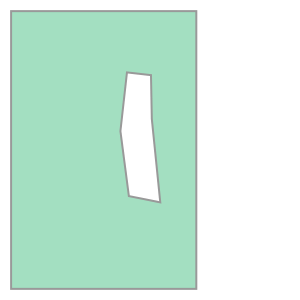

In [169]:
p2.difference(p1)

In [186]:
dir(p2)

['__and__',
 '__array_interface__',
 '__bool__',
 '__class__',
 '__del__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__geo_interface__',
 '__geom__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__nonzero__',
 '__or__',
 '__p__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__sub__',
 '__subclasshook__',
 '__weakref__',
 '__xor__',
 '_crs',
 '_ctypes_data',
 '_exterior',
 '_geom',
 '_get_coords',
 '_interiors',
 '_is_empty',
 '_lgeos',
 '_ndim',
 '_other_owned',
 '_repr_svg_',
 '_set_coords',
 'almost_equals',
 'area',
 'array_interface_base',
 'boundary',
 'bounds',
 'buffer',
 'centroid',
 'contains',
 'convex_hull',
 'coords',
 'covers',
 'crosses',
 'ctypes',
 'difference',
 'disjoint',
 'distance',
 'empty',
 'envelope',
 'equals',
 'equals_exact',
 'exterior',
 'from_bounds

In [188]:
p3 = p2.difference(p1)

In [189]:
p3.area + p1.area

8640000.0

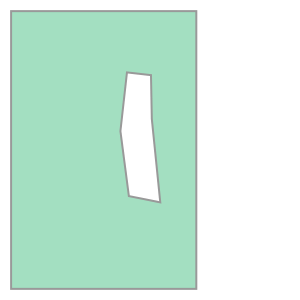

In [191]:
p3

In [170]:
file_in

'/media/thistle/Passport/gis/nz/lidar/points2.las'

In [192]:
t1 = {
    "pipeline":[
        {
            "type":"readers.las",
            "filename":file_in
        },
        {
            "type":"filters.crop",
            "polygon":p3.to_wkt()
        },
        {
            "type":"writers.las",
            "filename": "../data/goob2.las"
        }
    ]
}

In [193]:
pt1 = pdal.Pipeline(json.dumps(t1))
pt1.validate()

True

In [194]:
%%time
np = pt1.execute()
print(f"{np} pts written")

11184153 pts written
CPU times: user 4.98 s, sys: 239 ms, total: 5.22 s
Wall time: 5.2 s


In [ ]:
p

In [163]:
p1_wkt = p1.to_wkt()

In [164]:
pipeline1 = {
  "pipeline": [
      {   "type": "readers.las",
          "filename": file_in
      },
      {
          "type":"filters.crop",
          "polygon": p1_wkt
      },
      {
          "type": "writers.las",
          "filename": file_out1
      },
      {    "type":"filters.outlier",
           "method":"statistical",
           "mean_k":"8",
           "multiplier":"3"
      },
      {
          "type":"filters.smrf"
      },
      {
          "type":"filters.range",
          "limits":"Classification[2:2]"
      },
      {
          "type":"filters.delaunay"
      },
      {
        "type":"filters.divider",
        "count":"2"
      },
      {
        "type": "writers.gdal",
        "gdaldriver": "GTIFF",
        "output_type": "all",
        "resolution": "2.0",
        "filename": "../data/nz_clipped_tif_#.tif"
      }
  ]}

In [156]:
pp1 = pdal.Pipeline(json.dumps(pipeline1))
pp1.validate()

True

In [157]:
%%time 
np = pp1.execute()
print(f"file clipped to {np} points")

file clipped to 56993 points
CPU times: user 2.8 s, sys: 142 ms, total: 2.94 s
Wall time: 2.93 s


In [136]:
!pdal info /media/thistle/Passport/gis/nz/lidar/points2.las

{
  "filename": "/media/thistle/Passport/gis/nz/lidar/points2.las",
  "pdal_version": "2.0.1 (git-version: 6600e6)",
  "stats":
  {
    "bbox":
    {
      "EPSG:4326":
      {
        "bbox":
        {
          "maxx": 168.875503,
          "maxy": -45.02279352,
          "maxz": 1644.3,
          "minx": 168.8564059,
          "miny": -45.04218257,
          "minz": 851.49
        },
        "boundary": "{ \"type\": \"Polygon\", \"coordinates\": [ [ [ 168.856405879637805, -45.041538895078162, 851.49 ], [ 168.857760655910482, -45.022793521481582, 851.49 ], [ 168.875503036898749, -45.023436773533902, 1644.3 ], [ 168.874154023259251, -45.042182565347751, 1644.3 ], [ 168.856405879637805, -45.041538895078162, 851.49 ] ] ] }"
      },
      "native":
      {
        "bbox":
        {
          "maxx": 1275059.08,
          "maxy": 5006165.45,
          "maxz": 1644.3,
          "minx": 1273657.62,
          "miny": 5004077.6,
          "minz": 851.49
        },
        "boundary": "{ \"ty

## use gdal to make an elevation model

In [18]:
!gdaldem hillshade ../data/nz_clipped_tif.tif ../data/nz_clipped_hs.tif -z 1.0 -s 1.0 -az 315.0 -alt 45.0 -of GTiff

0...10...20...30...40...50...60...70...80...90...100 - done.


In [50]:
# json.loads(pp1.metadata)['metadata']['readers.las'][0]['srs']

In [48]:
# dir(pp1)

In [19]:
pp1.arrays[0].shape

(553807,)

In [20]:
arr = pp1.arrays[0]
desc = arr.dtype.descr
desc

[('X', '<f8'),
 ('Y', '<f8'),
 ('Z', '<f8'),
 ('Intensity', '<u2'),
 ('ReturnNumber', '|u1'),
 ('NumberOfReturns', '|u1'),
 ('ScanDirectionFlag', '|u1'),
 ('EdgeOfFlightLine', '|u1'),
 ('Classification', '|u1'),
 ('ScanAngleRank', '<f4'),
 ('UserData', '|u1'),
 ('PointSourceId', '<u2'),
 ('GpsTime', '<f8')]

In [21]:
cols = [col for (col, _) in desc]

In [22]:
cols

['X',
 'Y',
 'Z',
 'Intensity',
 'ReturnNumber',
 'NumberOfReturns',
 'ScanDirectionFlag',
 'EdgeOfFlightLine',
 'Classification',
 'ScanAngleRank',
 'UserData',
 'PointSourceId',
 'GpsTime']

In [23]:
df = pd.DataFrame({col: arr[col] for col in cols})

In [24]:
df.head()

,X,Y,Z,Intensity,ReturnNumber,NumberOfReturns,ScanDirectionFlag,EdgeOfFlightLine,Classification,ScanAngleRank,UserData,PointSourceId,GpsTime
0,1276749.39,5004272.31,863.75,20,1,1,1,0,2,7.0,0,42,255292.479196
1,1276749.63,5004272.05,863.87,22,1,1,0,0,2,7.0,0,42,255292.484450
2,1276749.37,5004271.48,864.17,26,1,1,0,0,2,7.0,0,42,255292.484457
3,1276749.91,5004270.20,864.83,24,1,1,1,0,2,7.0,0,42,255292.500028
4,1276750.17,5004270.77,864.49,24,1,1,1,0,2,7.0,0,42,255292.500035


In [25]:
df["X_o"] = df['X']
df['Y_o'] = df["Y"]
df["Z_o"] = df["Z"]

df['X'] = df['X'] - df['X_o'].min()
df['Y'] = df['Y'] - df['Y_o'].min()
df['Z'] = df['Z'] - df['Z_o'].min()

In [26]:
a = df.iloc[0] # a series
#type(a)
a

X                    1.712600e+02
Y                    2.031300e+02
Z                    8.289000e+01
Intensity            2.000000e+01
ReturnNumber         1.000000e+00
NumberOfReturns      1.000000e+00
ScanDirectionFlag    1.000000e+00
EdgeOfFlightLine     0.000000e+00
Classification       2.000000e+00
ScanAngleRank        7.000000e+00
UserData             0.000000e+00
PointSourceId        4.200000e+01
GpsTime              2.552925e+05
X_o                  1.276749e+06
Y_o                  5.004272e+06
Z_o                  8.637500e+02
Name: 0, dtype: float64

In [27]:
fig = p3.figure(width=1000)
fig.xlabel='Y'
fig.ylabel="Z"
fig.Zlabel="X"
all_points = p3.scatter(df["Y"], df['Z'], df['X'], color='red', size=0.2)
p3.squarelim()

In [1]:
p3.show()

NameError: name 'p3' is not defined

In [73]:
%pdoc p3.squarelim

try to read lightning data

In [31]:
# from original csv
filepath = "/media/thistle/Passport/gis/nz/lightning/mfe-lightning-strikes-20012016-CSV/lightning-strikes-20012016.csv"

In [32]:
with open(filepath, ) as f:
    for i in range(5):
        print(f.readline())

﻿lon,lat,year,month

177.275,-35.5582,2000,8

177.0922,-35.5696,2000,8

177.9768,-33.7629,2000,8

177.3294,-33.9202,2000,8



In [33]:
# now try to read from the shapefile
filepath = "/media/thistle/Passport/gis/nz/lightning/strikes.shp.dir/strikes.shp"

In [34]:
c = fiona.open(filepath)
rec1 = c.next()

/home/thistle/anaconda3/envs/nb-pcp-env/lib/python3.7/site-packages/ipykernel_launcher.py:2: FionaDeprecationWarning: Collection.__next__() is buggy and will be removed in Fiona 2.0. Switch to `next(iter(collection))`.
  


In [35]:
rec1

{'type': 'Feature',
 'id': '0',
 'properties': OrderedDict([('month', 8), ('year', 2000)]),
 'geometry': {'type': 'Point', 'coordinates': (177.275, -35.5582)}}

In [ ]:
rec2 = c.next()

## so both csv and shape are in lon/lat coordinates

/home/thistle/Documents/dev/ML/gis_project/data/aoi/nz_aois.shp

In [47]:
# try to find the tile from lidar index that contains another shape
#for a strikingly interesting get the polygon shape from qgis and save as "../data/aoi/nz_aois.shp"
# this is a small polygon with 5 million or less points
filepath = "/home/thistle/Documents/dev/ML/gis_project/data/aoi/nz_aois.shp"
# this contains one shape- Mt Magneto
# see qgis projects @ /media/thistle/Passport/gis/nz/del_dems.qgz and /media/thistle/Passport/gis/nz/gold_nz.qgz

c = fiona.open(filepath)
rec1 = c.next()

rec1 # srs already set to epsg:2193
# this polygon was drawn at a site where lightning strikes seem more than random :]
# Mt Magneto near the arrow river site

mtmag_poly = rec1.get('geometry').get('coordinates')[0]

p1 = shapely.geometry.Polygon(mtmag_poly)
p1

In [38]:
c = fiona.open(filepath)
rec1 = c.next()

/home/thistle/anaconda3/envs/nb-pcp-env/lib/python3.7/site-packages/ipykernel_launcher.py:2: FionaDeprecationWarning: Collection.__next__() is buggy and will be removed in Fiona 2.0. Switch to `next(iter(collection))`.
  


In [39]:
rec1 # srs already set to epsg:2193
# this polygon was drawn at a site where lightning strikes seem more than random :]
# Mt Magneto near the arrow river site

{'type': 'Feature',
 'id': '0',
 'properties': OrderedDict([('site_name', 'mt_magneto1')]),
 'geometry': {'type': 'Polygon',
  'coordinates': [[(1275016.4912221471, 5004844.812846744),
    (1275101.419895499, 5005605.632212188),
    (1275412.8250311224, 5005570.245264959),
    (1275423.4411152916, 5005004.054109279),
    (1275533.1406517043, 5003921.213524043),
    (1275126.1907585599, 5004002.603502671),
    (1275016.4912221471, 5004844.812846744)]]}}

In [51]:
mtmag_poly = rec1.get('geometry').get('coordinates')[0]

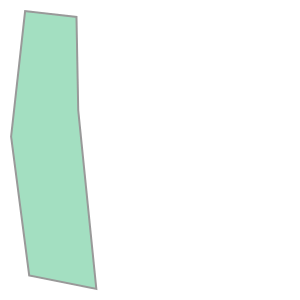

In [52]:
p1 = shapely.geometry.Polygon(mtmag_poly)
p1

so redo pipeline with new area of interest after i find out which tiles it intersects with

In [47]:
# try to find the tile from lidar index that contains another shape
#for a strikingly interesting get the polygon shape from qgis and save as "../data/aoi/nz_aois.shp"
# this is a small polygon with 5 million or less points
filepath = "/home/thistle/Documents/dev/ML/gis_project/data/aoi/nz_aois.shp"
# this contains one shape- Mt Magneto
# see qgis projects @ /media/thistle/Passport/gis/nz/del_dems.qgz and /media/thistle/Passport/gis/nz/gold_nz.qgz

c = fiona.open(filepath)
rec1 = c.next()

rec1 # srs already set to epsg:2193
# this polygon was drawn at a site where lightning strikes seem more than random :]
# Mt Magneto near the arrow river site

mtmag_poly = rec1.get('geometry').get('coordinates')[0]

p1 = shapely.geometry.Polygon(mtmag_poly)
p1

In [68]:
# The tile index shape file is located at --> 
tiles_path = "/media/thistle/Passport/gis/nz/lds-otago-075m-rural-aerial-photos-index-tiles-2004-2011-SHP/otago-075m-rural-aerial-photos-index-tiles-2004-2011.shp"

In [81]:
for i in range(10):
    if (i < 3):
        print(i)

0
1
2


In [84]:
# poly_of_interst = p1
f = fiona.open(tiles_path)
count = 0

for tile in f:
    tile_poly = shapely.geometry.Polygon(tile['geometry']['coordinates'][0])
    inter = p1.intersection(tile_poly)
    if(inter.area > 0):
        count+=1
        
print(f"we need to select {count} tiles")      
    

we need to select 1 tiles


In [88]:
# poly_of_interst = p1
f = fiona.open(tiles_path)
count = 0
tile_polys = []
tiles = []
for tile in f:
    tile_poly = shapely.geometry.Polygon(tile['geometry']['coordinates'][0])
    inter = p1.intersection(tile_poly)
    if(inter.area > 0):
        tile_polys.append(tile_poly)
        tiles.append(tile)
        count+=1
        
print(f"we need selected {count} tiles")
    

we need selected 1 tiles


In [89]:
len(tiles)

1

In [90]:
tiles[0] # 2009_0750_CC11_5K_0210

{'type': 'Feature',
 'id': '738',
 'properties': OrderedDict([('OBJECTID', 2683),
              ('TILENAME', '2009_0750_CC11_5K_0210'),
              ('DATASTOR_N', 'CC11_5K_0210'),
              ('PROJECTION', 'NZTM'),
              ('COMPANY', 'TIL'),
              ('FLY_DATE', '2008-12-12'),
              ('GSD', '0.75m'),
              ('ACCURACY', '+/-3.0m'),
              ('TILE_CUT', '1:5000'),
              ('REGION_1', 'Otago Region'),
              ('REGION_2', None),
              ('REGION_3', None),
              ('TLA_1', 'Queenstown-Lakes District'),
              ('TLA_2', 'Central Otago District'),
              ('TLA_3', None),
              ('TLA_4', None),
              ('CREDITS', 'Terralink International Ltd'),
              ('PARTIAL', 'no'),
              ('SEASON', '2008_2009'),
              ('COLOUR', 'Colour'),
              ('TIF_Size', 43.98)]),
 'geometry': {'type': 'Polygon',
  'coordinates': [[(1276000.0000999998, 5002800.0001),
    (1273600.0000999998, 

In [ ]:
# so go select this one to display in qgis
# I did

In [ ]:
# try to display the bounds of points.las

In [96]:
!pdal info ../data/points.las --metadata

{
  "filename": "../data/points.las",
  "metadata":
  {
    "comp_spatialreference": "COMPD_CS[\"NZGD2000 / New Zealand Transverse Mercator 2000 + NZVD2016 height\",PROJCS[\"NZGD2000 / New Zealand Transverse Mercator 2000\",GEOGCS[\"NZGD2000\",DATUM[\"New_Zealand_Geodetic_Datum_2000\",SPHEROID[\"GRS 1980\",6378137,298.257222101,AUTHORITY[\"EPSG\",\"7019\"]],TOWGS84[0,0,0,0,0,0,0],AUTHORITY[\"EPSG\",\"6167\"]],PRIMEM[\"Greenwich\",0,AUTHORITY[\"EPSG\",\"8901\"]],UNIT[\"degree\",0.0174532925199433,AUTHORITY[\"EPSG\",\"9122\"]],AUTHORITY[\"EPSG\",\"4167\"]],PROJECTION[\"Transverse_Mercator\"],PARAMETER[\"latitude_of_origin\",0],PARAMETER[\"central_meridian\",173],PARAMETER[\"scale_factor\",0.9996],PARAMETER[\"false_easting\",1600000],PARAMETER[\"false_northing\",10000000],UNIT[\"metre\",1,AUTHORITY[\"EPSG\",\"9001\"]],AXIS[\"Northing\",NORTH],AXIS[\"Easting\",EAST],AUTHORITY[\"EPSG\",\"2193\"]],VERT_CS[\"NZVD2016 height\",VERT_DATUM[\"New Zealand Vertical Datum 2016\",2005,AUTHORITY[\"EPS

In [100]:
!pdal info ../data/points.las --stats | jq .stats.bbox.native.bbox

{
  "maxx": 1277038.29,
  "maxy": 5006227.75,
  "maxz": 1404.07,
  "minx": 1275745.46,
  "miny": 5003951.5,
  "minz": 743.34
}


In [101]:
p1.bounds

(1275016.4912221471, 5003921.213524043, 1275533.1406517043, 5005605.632212188)

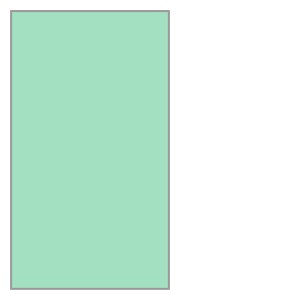

In [104]:
p_ = [(1277038.29, 5006227.75), (1275745.46, 5006227.75),(1275745.46, 5003951.5), (1277038.29, 5003951.5), (1277038.29, 5006227.75)]
noi = shapely.geometry.Polygon(p_)
noi

In [114]:
# write this shape to file
filepath = "../data/del/test"
if not os.path.isdir(filepath):
    print('duh')
    os.makedirs(filepath)

In [117]:
shpfile_path = os.path.join(filepath, "test.shp")
schema = {'geometry': "Polygon", "properties":{"id":"int"}}

In [120]:
with fiona.open(shpfile_path, "w", "ESRI Shapefile",schema) as output:
    npoly = shapely.geometry.Polygon(p_)
    output.write({
        'properties': {
            "id": 1
        },
        "geometry": mapping(npoly)
    })
    

In [116]:
%pdoc fiona.open

In [70]:
r1 = next(f)

/home/thistle/anaconda3/envs/nb-pcp-env/lib/python3.7/site-packages/ipykernel_launcher.py:1: FionaDeprecationWarning: Collection.__next__() is buggy and will be removed in Fiona 2.0. Switch to `next(iter(collection))`.
  """Entry point for launching an IPython kernel.


In [71]:
print(type(r1))
r1

<class 'dict'>


{'type': 'Feature',
 'id': '0',
 'properties': OrderedDict([('OBJECTID', 1983),
              ('TILENAME', '2007_0750_CB10_5K_1001'),
              ('DATASTOR_N', 'CB10_5K_1001'),
              ('PROJECTION', 'NZTM'),
              ('COMPANY', 'TIL'),
              ('FLY_DATE', '2007-02-17'),
              ('GSD', '0.75m'),
              ('ACCURACY', '+/-10.0m'),
              ('TILE_CUT', '1:5000'),
              ('REGION_1', 'Otago Region'),
              ('REGION_2', None),
              ('REGION_3', None),
              ('TLA_1', 'Queenstown-Lakes District'),
              ('TLA_2', None),
              ('TLA_3', None),
              ('TLA_4', None),
              ('CREDITS', 'Terralink International Ltd'),
              ('PARTIAL', 'no'),
              ('SEASON', '2006_2007'),
              ('COLOUR', 'Colour'),
              ('TIF_Size', 43.98)]),
 'geometry': {'type': 'Polygon',
  'coordinates': [[(1230400.0000999998, 5010000.0001),
    (1228000.0003000004, 5010000.0001),
    (1

In [2]:
# need to make dem and hillshade for points3.las
filepath = "/media/thistle/Passport/gis/nz/lidar/points3.las"
outdem = "/home/thistle/Documents/dev/ML/gis_project/data/site3.tif"
out_hs = "/home/thistle/Documents/dev/ML/gis_project/data/site3_hs.tif"

In [5]:
pipeline = {
  "pipeline": [
      {   "type": "readers.las",
          "filename": filepath
      },
      {    "type":"filters.outlier",
           "method":"statistical",
           "mean_k":"8",
           "multiplier":"3"
      },
      {
          "type":"filters.smrf"
      },
      {
          "type":"filters.range",
          "limits":"Classification[2:2]"
      },
      {
          "type":"filters.delaunay"
      },
      {
        "type": "writers.gdal",
        "gdaldriver": "GTIFF",
        "output_type": "all",
        "resolution": "2.0",
        "filename": outdem
      }
  ]}

In [6]:
pp = pdal.Pipeline(json.dumps(pipeline))
pp.validate()

True

In [7]:
%%time
numpts = pp.execute()
print(f'{numpts} processed on pipeline')

34564900 processed on pipeline
CPU times: user 14min 46s, sys: 11.9 s, total: 14min 58s
Wall time: 15min 19s


In [8]:
!gdaldem hillshade $outdem $out_hs -z 1.0 -s 1.0 -az 315.0 -alt 45.0 -of GTiff

0...10...20...30...40...50...60...70...80...90...100 - done.


In [13]:
overview1 = "/media/thistle/Passport/gis/nz/ArrowRiverSites.png"

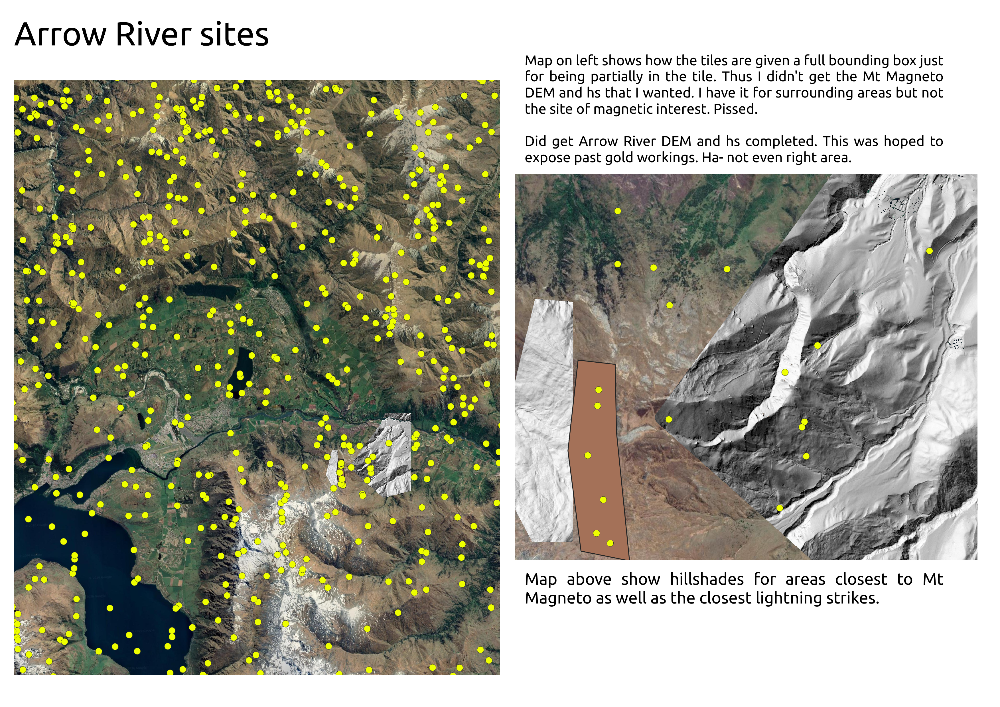

In [14]:
from IPython.display import Image
Image(overview1, width=1000, height=800)

In [12]:
# missing a hs. make it...
in_dem = "/home/thistle/Documents/dev/ML/gis_project/data/nz_clipped_tif2.tif"
out_hs = "/home/thistle/Documents/dev/ML/gis_project/data/nz_clipped_tif2_hs.tif"
!gdaldem hillshade $outdem $out_hs -z 1.0 -s 1.0 -az 315.0 -alt 45.0 -of GTiff

0...10...20...30...40...50...60...70...80...90...100 - done.
